In [1]:
# import the necessary packages
import numpy as np
import cv2
import argparse
import matplotlib.pyplot as plt
from skimage.filters import threshold_adaptive
import scipy.misc
import glob
import math

In [2]:
def visualize_images_2D(list_imgs):
    
    #list_imgs = list of index of images to be visualized
    _, ax = plt.subplots( math.ceil(len(list_imgs)/2), 2, figsize=(10,200))
    row, col = 0, 0  
    for img in list_imgs:
        ax[row,col].imshow(img)        
        ax[row,col].axis('off')
        
        col+=1
        
        if col == 2:
            row += 1
            col = 0
    plt.show()

In [3]:
def OrderPoints(points):
    # initialzie a list of coordinates that will be ordered
    # such that the first entry in the list is the top-left,
    # the second entry is the top-right, the third is the
    # bottom-right, and the fourth is the bottom-left
    rect = np.zeros((4,2), dtype = "float32")
    
    # the top-left point will have the smallest sum, whereas
    # the bottom-right point will have the largest sum
    calc = points.sum(axis=1)    
    rect[0] = points[np.argmin(calc)]
    rect[2] = points[np.argmax(calc)]
    
    # now, compute the difference between the points, the
    # top-right point will have the smallest difference,
    # whereas the bottom-left will have the largest difference
    calc = np.diff(points)    
    rect[1] = points[np.argmax(calc)]
    rect[3] = points[np.argmin(calc)]
    
    return rect

def four_point_transform(image, pts):
    # obtain a consistent order of the points and unpack them
    # individually
    rect = order_points(pts)
    (tl, tr, br, bl) = rect

    # compute the width of the new image, which will be the
    # maximum distance between bottom-right and bottom-left
    # x-coordiates or the top-right and top-left x-coordinates
    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    maxWidth = max(int(widthA), int(widthB))

    # compute the height of the new image, which will be the
    # maximum distance between the top-right and bottom-right
    # y-coordinates or the top-left and bottom-left y-coordinates
    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
    maxHeight = max(int(heightA), int(heightB))

    # now that we have the dimensions of the new image, construct
    # the set of destination points to obtain a "birds eye view",
    # (i.e. top-down view) of the image, again specifying points
    # in the top-left, top-right, bottom-right, and bottom-left
    # order
    dst = np.array([
    [0, 0],
    [maxWidth - 1, 0],
    [maxWidth - 1, maxHeight - 1],
    [0, maxHeight - 1]], dtype = "float32")

    # compute the perspective transform matrix and then apply it
    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))

    # return the warped image
    return warped

def color_gradient_combo_pipeline(img1, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img1)
    # Convert to HLS color space and separate the S and L channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    
    # Apply sobel on L channel
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Apply a threshold on S color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1    
    
    #combine Gradient threshold and Color threshold
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    color_binary = 255 * np.dstack((combined_binary, combined_binary, combined_binary)).astype('uint8')
    return color_binary, combined_binary

In [1]:
# load the image and compute the ratio of the old height
# to the new height, clone it, and resize it
image = cv2.imread("./images/2.JPG")
ratio =  500.0/image.shape[0]
orig = image.copy()
image = cv2.resize(image, (500,int(image.shape[1]*ratio)))
print(ratio,image.shape,orig.shape)
# convert the image to grayscale, blur it, and find edges
# in the image
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
gray = cv2.GaussianBlur(gray, (5, 5), 0)
edged = cv2.Canny(gray, 100, 200)
#edged = edged.astype(dtype = "int32") 
# show the original image and the edge detected image
print ("STEP 1: Edge Detection")
'''cv2.imshow("OrigImage", orig)
cv2.imshow("Image", image)
cv2.imshow("Edged", edged)
cv2.waitKey(0)
cv2.destroyAllWindows()'''
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()
print()
plt.imshow(edged,cmap="gray")
plt.show()


NameError: name 'cv2' is not defined

In [ ]:
print(edged.dtype)
im,cnts, _ = cv2.findContours(edged.copy(), cv2.RETR_FLOODFILL, cv2.CHAIN_APPROX_NONE)
#cnts = sorted(cnts, key = cv2.contourArea, reverse = True)[:5]
contorImager = image.copy()
cv2.drawContours(contorImager, cnts, -1, (0, 255, 0), 2)
plt.imshow(contorImager)
plt.show()
# loop over the contours
points = []
for c in cnts:
    for p in c:
        points.append(p)
        #print(p)

npPoints = np.asarray(points)
npPoints = np.reshape(npPoints,(npPoints.shape[0],2))
points = OrderPoints(npPoints)
# show the contour (outline) of the piece of paper
print ("STEP 2: Find contours of paper")
color=[255, 0, 0]
print(points)
cv2.line(image, (points[0][0],points[0][1]), (points[1][0],points[1][1]), color, 10)
cv2.line(image, (points[1][0],points[1][1]), (points[2][0],points[2][1]), color, 10)
cv2.line(image, (points[2][0],points[2][1]), (points[3][0],points[3][1]), color, 10)
cv2.line(image, (points[3][0],points[3][1]), (points[0][0],points[0][1]), color, 10)

'''cv2.imshow("Outline", image)
cv2.waitKey(0)
cv2.destroyAllWindows()'''
plt.imshow(image)
plt.show()

.\images\1.JPG


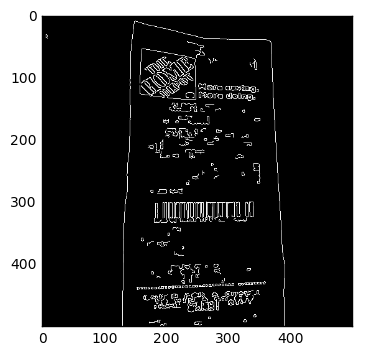

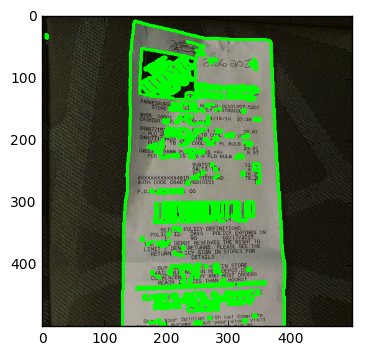

[[   5.   31.]
 [ 129.  499.]
 [ 390.  498.]
 [ 367.   41.]]


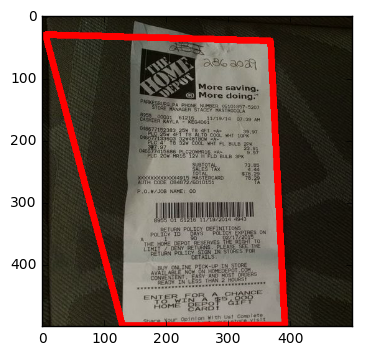

In [7]:
imageList = []
images = glob.glob(".\images\*.jpg")
for frame in images:
    print(frame)    
    # load the image and compute the ratio of the old height
    # to the new height, clone it, and resize it
    image = cv2.imread("./images/1.JPG")
    ratio =  500.0/image.shape[0]
    orig = image.copy()
    image = cv2.resize(image, (500,int(image.shape[1]*ratio)))
    
    # convert the image to grayscale, blur it, and find edges
    # in the image
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)
    edged = cv2.Canny(gray, 100, 200)
    edged = edged.astype(dtype = "int32") 
    
    plt.imshow(edged,cmap="gray")
    plt.show()
    
    # show the original image and the edge detected image
    
    im,cnts, _ = cv2.findContours(edged.copy(), cv2.RETR_FLOODFILL, cv2.CHAIN_APPROX_NONE)
    contorImager = image.copy()
    cv2.drawContours(contorImager, cnts, -1, (0, 255, 0), 2)
    plt.imshow(contorImager,cmap="gray")
    plt.show()
    # loop over the contours
    points = []
    for c in cnts:
        for p in c:
            points.append(p)
    
    npPoints = np.asarray(points)
    npPoints = np.reshape(npPoints,(npPoints.shape[0],2))
    if npPoints.shape[0] == 0:
        continue
    points = OrderPoints(npPoints)
    # show the contour (outline) of the piece of paper
    color=[255, 0, 0]
    
    imageList.append(image.copy())
    print(points)
    cv2.line(image, (points[0][0],points[0][1]), (points[1][0],points[1][1]), color, 10)
    cv2.line(image, (points[1][0],points[1][1]), (points[2][0],points[2][1]), color, 10)
    cv2.line(image, (points[2][0],points[2][1]), (points[3][0],points[3][1]), color, 10)
    cv2.line(image, (points[3][0],points[3][1]), (points[0][0],points[0][1]), color, 10)
    plt.imshow(image)
    plt.show()
    imageList.append(image)
    break

276


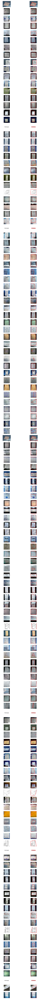

In [19]:
print(len(imageList))
visualize_images_2D(imageList)

.\images\1.JPG .\images\1.png


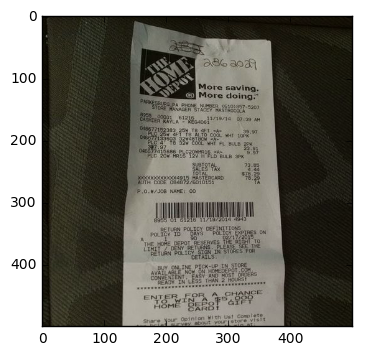

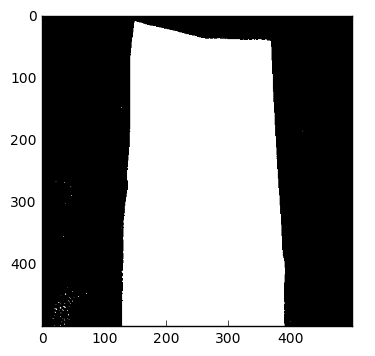

.\images\10.JPG .\images\107.png


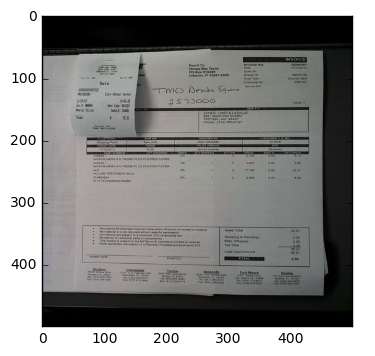

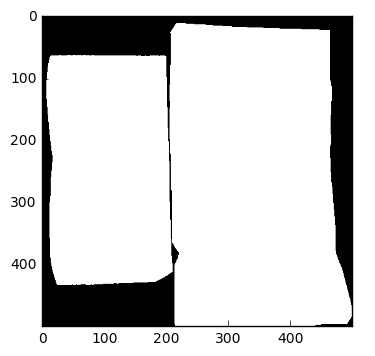

.\images\100.JPG .\images\11.png


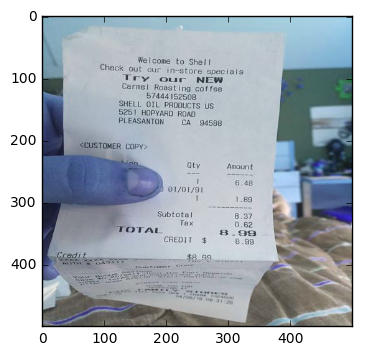

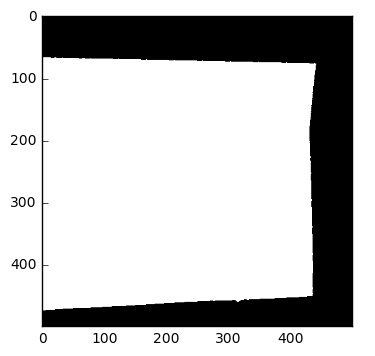

.\images\101.JPG .\images\123.png


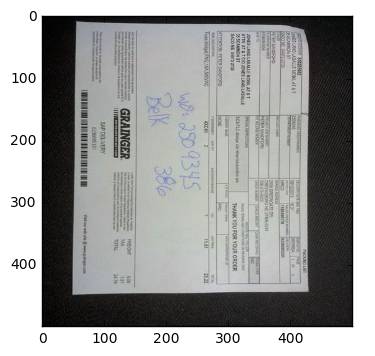

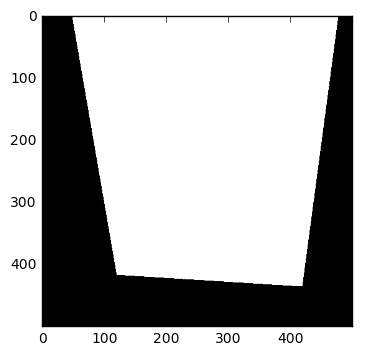

.\images\102.JPG .\images\124.png


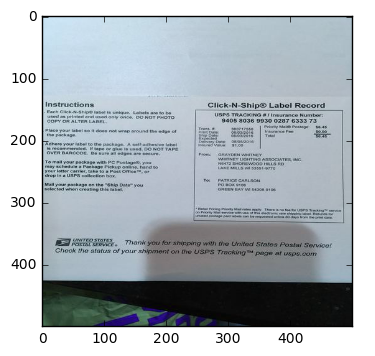

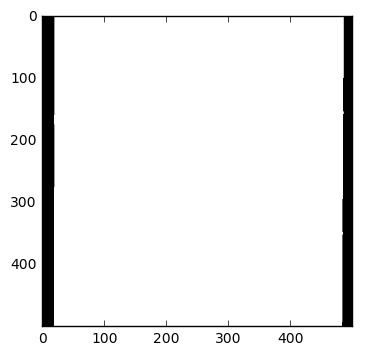

.\images\103.JPG .\images\132.png


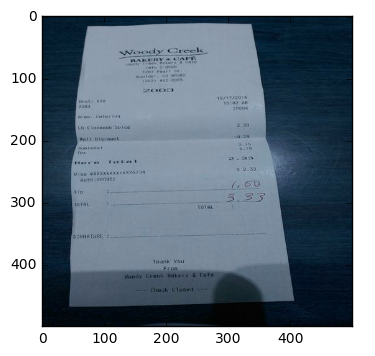

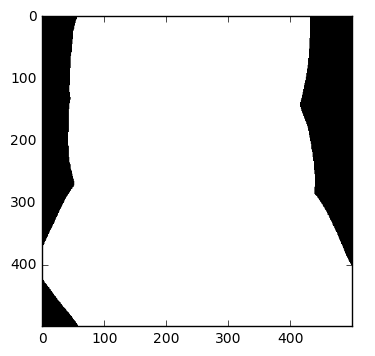

.\images\104.JPG .\images\147.png


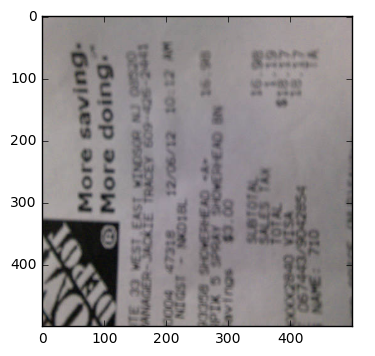

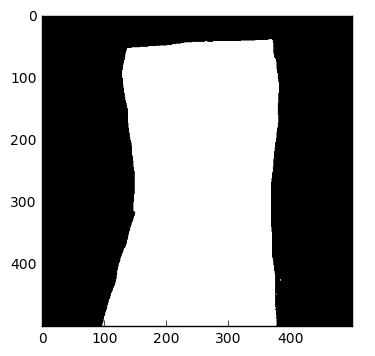

.\images\105.JPG .\images\18.png


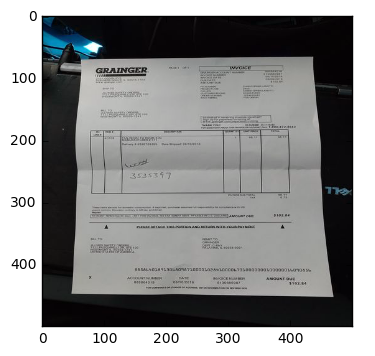

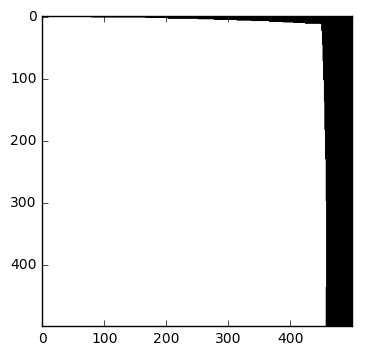

.\images\106.JPG .\images\2.png


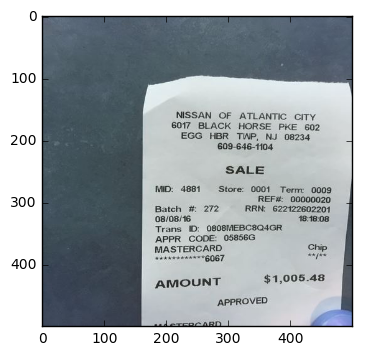

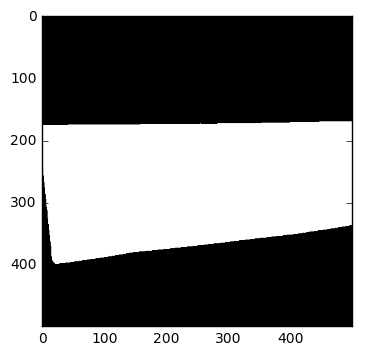

.\images\107.JPG .\images\24.png


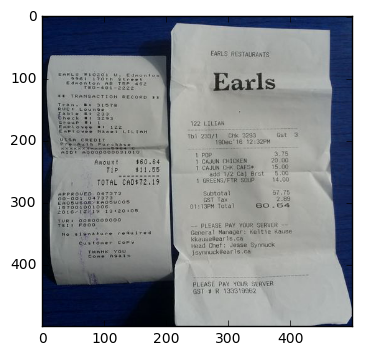

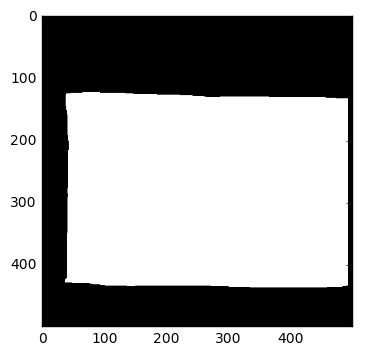

.\images\108.JPG .\images\27.png


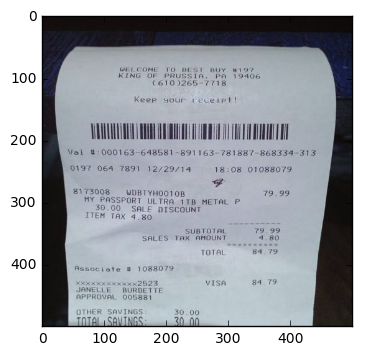

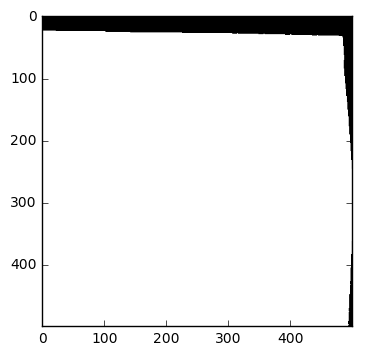

.\images\109.JPG .\images\29.png


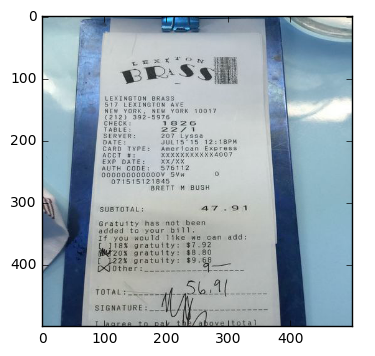

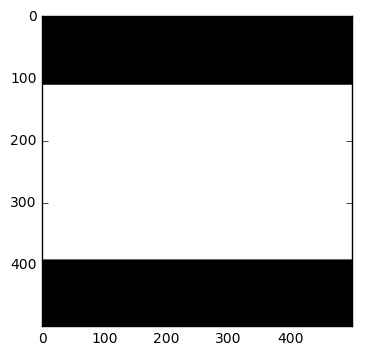

.\images\11.JPG .\images\3.png


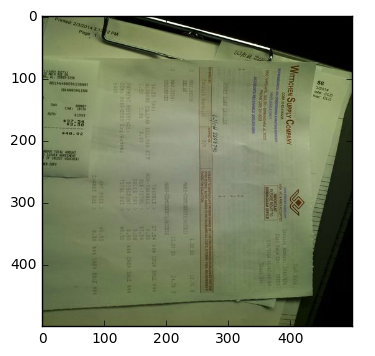

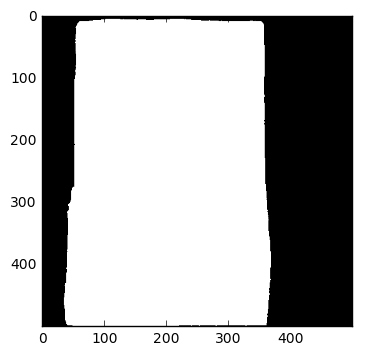

.\images\110.JPG .\images\4.png


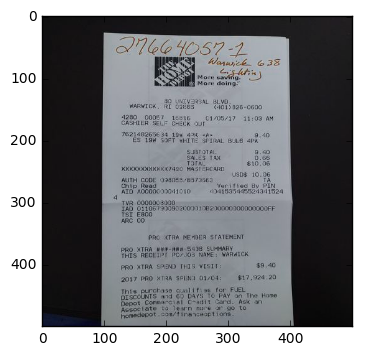

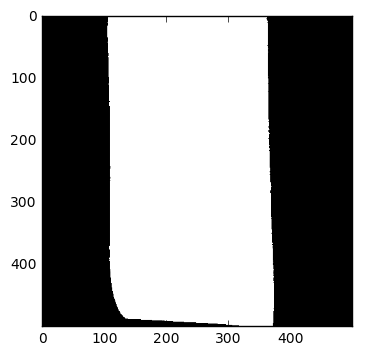

.\images\111.JPG .\images\46.png


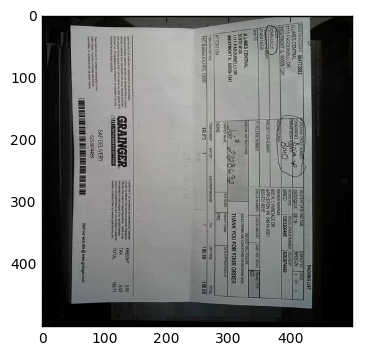

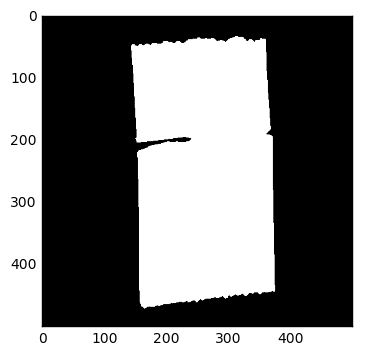

.\images\112.JPG .\images\5.png


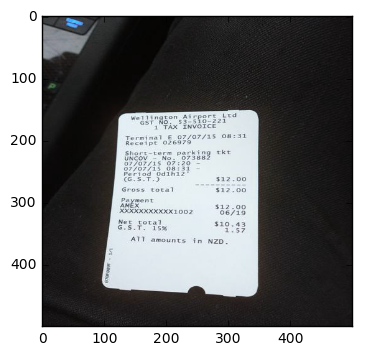

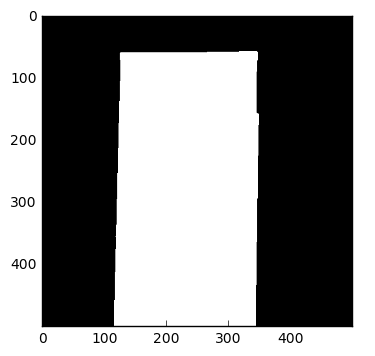

.\images\113.JPG .\images\59.png


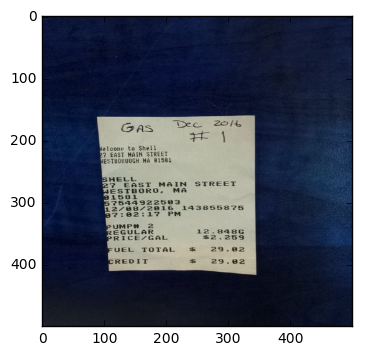

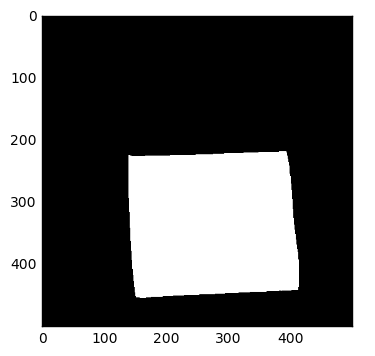

.\images\114.JPG .\images\6.png


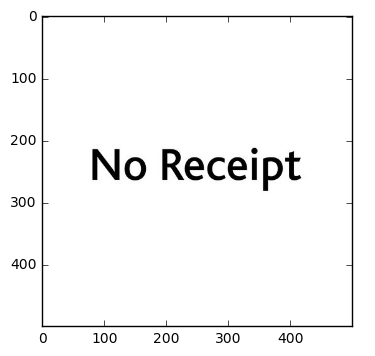

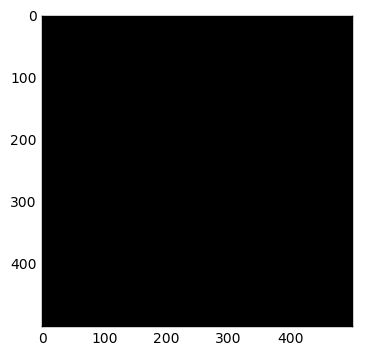

.\images\115.JPG .\images\60.png


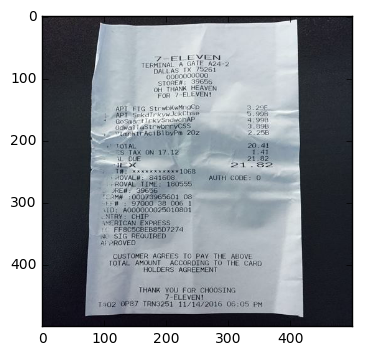

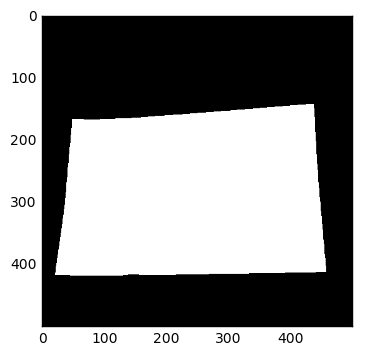

.\images\116.JPG .\images\73.png


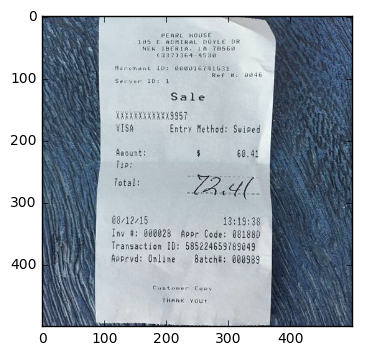

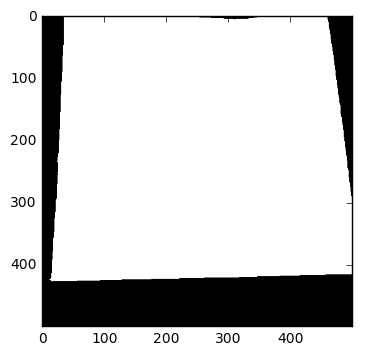

.\images\117.JPG .\images\94.png


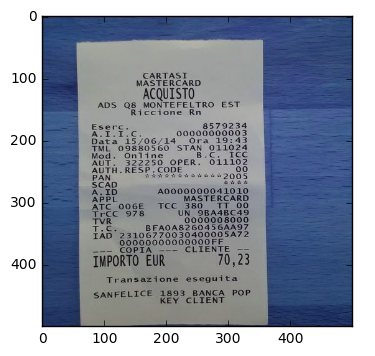

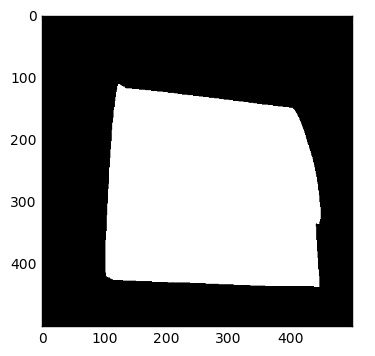

.\images\118.JPG .\images\95.png


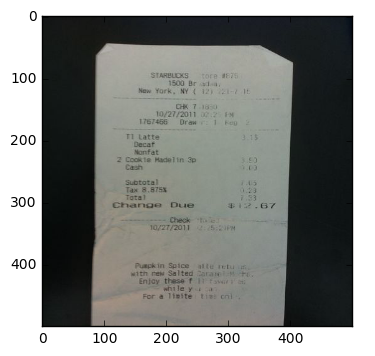

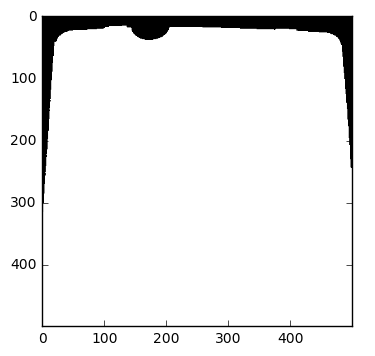

.\images\12.JPG .\images\96.png


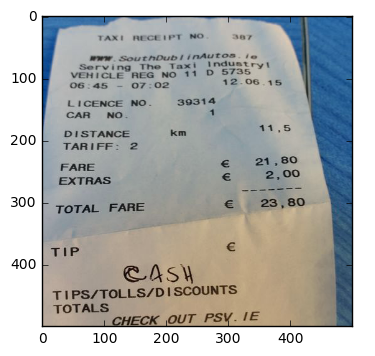

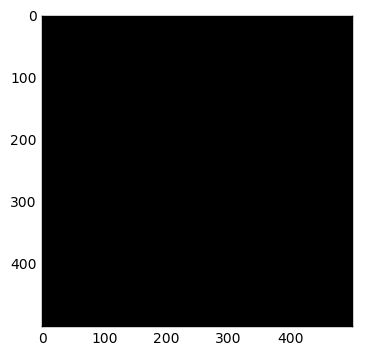

.\images\120.JPG .\images\97.png


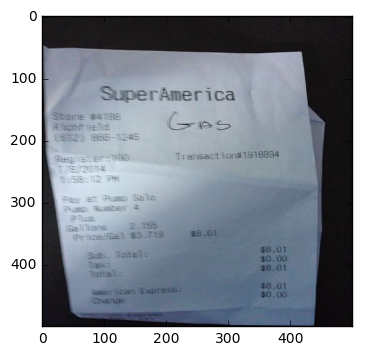

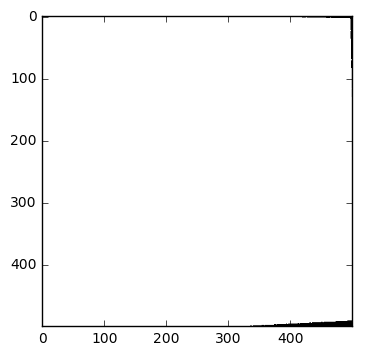

.\images\121.JPG .\images\98.png


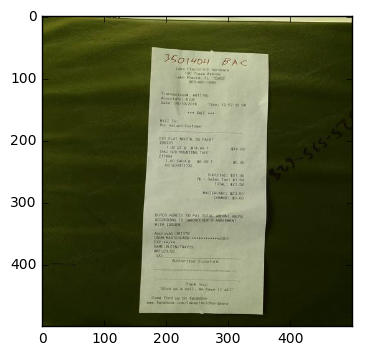

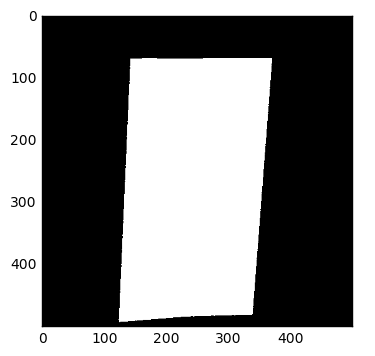

In [18]:
images = glob.glob(".\images\*.jpg")
images1 = glob.glob(".\images\*.png")

for (frame,frame1) in zip(images, images1):
    print(frame,frame1)    
    # load the image and compute the ratio of the old height
    # to the new height, clone it, and resize it
    image = cv2.imread(frame)
    image1 = cv2.imread(frame1)
    gray = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    
    plt.imshow(image)
    plt.show()
    
    plt.imshow(gray,cmap="gray")
    plt.show()